In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from pathlib import Path

In [3]:
import tensorflow as tf
from tensorflow import keras

In [4]:
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [5]:
datapath = "/kaggle/input/tomato-leaf-disease/dataset"
DATA_DIR = Path(datapath)

EPOCHS = 20
BATCHES = 32
IMAGE_SIZE = 256
CHANNEL = 3

In [6]:
data = keras.utils.image_dataset_from_directory(DATA_DIR)

Found 16011 files belonging to 10 classes.


In [7]:
class_names = data.class_names
class_names

['bacterial spot',
 'early blight',
 'healthy',
 'late blight',
 'leaf mold',
 'mosaic virus',
 'septoria leaf spot',
 'target spot',
 'two spotted spider mite',
 'yellowLeaf curl virus']

In [8]:
no_of_classes = len(class_names)
no_of_classes

10

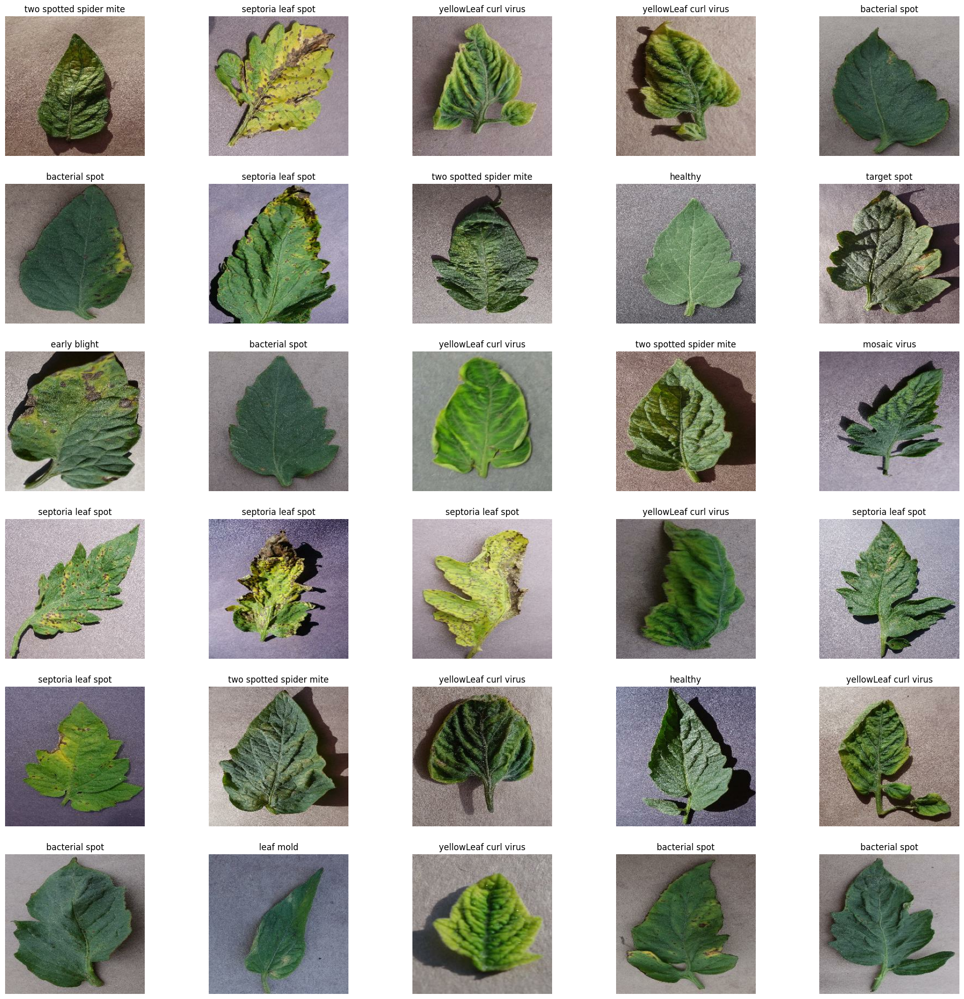

In [9]:
plt.figure(figsize=(25, 25))

for images, classes in data.take(1):
    for i in range(30):
        plt.subplot(6, 5, i + 1)
        plt.imshow(images[i].numpy().astype(int))
        plt.axis("off")
        plt.title(class_names[classes[i]])

In [10]:
def train_test_val_split(dataset, test_split=0.2, val_split=0.1, shuffle=True, shuffle_size=1000):
    ds_size = len(dataset)
    
    if shuffle:
        dataset = dataset.shuffle(shuffle_size, seed=45)
    
    test_size = int(ds_size * test_split)
    val_size = int(ds_size * val_split)
    
    ds_test = dataset.take(test_size)
    ds_val = dataset.skip(test_size).take(val_size)
    ds_train = dataset.skip(test_size).skip(val_size)
    
    return ds_train, ds_test, ds_val

In [11]:
ds_train, ds_test, ds_val = train_test_val_split(data)

In [12]:
# data resizing

resize_and_rescale = keras.models.Sequential()

resize_and_rescale.add(keras.layers.Resizing(IMAGE_SIZE, IMAGE_SIZE))
resize_and_rescale.add(keras.layers.Rescaling(scale = 1./255))

In [13]:
# creating augmented data for training

aug_data = keras.models.Sequential()

aug_data.add(keras.layers.RandomFlip())
aug_data.add(keras.layers.RandomRotation(0.2))

In [14]:
ds_aug = ds_train.map(lambda x, y: (aug_data(x, training=True), y))

In [15]:
ds_train = ds_train.concatenate(ds_aug)

In [16]:
#model building

model = keras.models.Sequential()

model.add(resize_and_rescale)
model.add(keras.layers.Conv2D(64, 3, 1, activation="relu"))
model.add(keras.layers.MaxPooling2D())
model.add(keras.layers.Conv2D(32, 3, 1, activation="relu"))
model.add(keras.layers.MaxPooling2D())
model.add(keras.layers.Conv2D(32, 3, 1, activation="relu"))
model.add(keras.layers.MaxPooling2D())
model.add(keras.layers.Conv2D(16, 3, 1, activation="relu"))
model.add(keras.layers.MaxPooling2D())
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(64, activation="relu"))
model.add(keras.layers.Dense(no_of_classes, activation="softmax"))

In [17]:
INPUT_SHAPE = (BATCHES, IMAGE_SIZE, IMAGE_SIZE, CHANNEL)
model.build(input_shape = INPUT_SHAPE)

In [18]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 256, 256, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (32, 254, 254, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (32, 127, 127, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (32, 125, 125, 32)     │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (32, 62, 62, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (32, 60, 60, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (32, 30, 30, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (32, 28, 28, 16)       │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (32, 14, 14, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (32, 3136)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (32, 64)               │       200,768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (32, 10)               │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 235,546 (920.10 KB)

 Trainable params: 235,546 (920.10 KB)

 Non-trainable params: 0 (0.00 B)

In [19]:
model.compile(optimizer='adam', loss=keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [20]:
history = model.fit(ds_train, batch_size=BATCHES, validation_data=ds_val, epochs=EPOCHS)

Epoch 1/20


I0000 00:00:1731681157.362813     107 service.cc:145] XLA service 0x7fefa400c650 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731681157.362861     107 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1731681157.362865     107 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


  3/702 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step - accuracy: 0.0590 - loss: 2.3112 

I0000 00:00:1731681164.246717     107 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


702/702 ━━━━━━━━━━━━━━━━━━━━ 174s 205ms/step - accuracy: 0.4318 - loss: 1.5852 - val_accuracy: 0.7344 - val_loss: 0.7710
Epoch 2/20
702/702 ━━━━━━━━━━━━━━━━━━━━ 144s 196ms/step - accuracy: 0.8007 - loss: 0.5671 - val_accuracy: 0.7387 - val_loss: 0.8174
Epoch 3/20
702/702 ━━━━━━━━━━━━━━━━━━━━ 145s 198ms/step - accuracy: 0.8587 - loss: 0.3854 - val_accuracy: 0.7887 - val_loss: 0.5913
Epoch 4/20
702/702 ━━━━━━━━━━━━━━━━━━━━ 145s 198ms/step - accuracy: 0.8906 - loss: 0.3210 - val_accuracy: 0.8525 - val_loss: 0.4500
Epoch 5/20
702/702 ━━━━━━━━━━━━━━━━━━━━ 145s 197ms/step - accuracy: 0.9101 - loss: 0.2617 - val_accuracy: 0.8763 - val_loss: 0.3802
Epoch 6/20
702/702 ━━━━━━━━━━━━━━━━━━━━ 146s 199ms/step - accuracy: 0.9207 - loss: 0.2324 - val_accuracy: 0.8769 - val_loss: 0.3688
Epoch 7/20
702/702 ━━━━━━━━━━━━━━━━━━━━ 144s 196ms/step - accuracy: 0.9276 - loss: 0.2135 - val_accuracy: 0.9062 - val_loss: 0.2980
Epoch 8/20
702/702 ━━━━━━━━━━━━━━━━━━━━ 147s 200ms/step - accuracy: 0.9358 - loss: 0.18

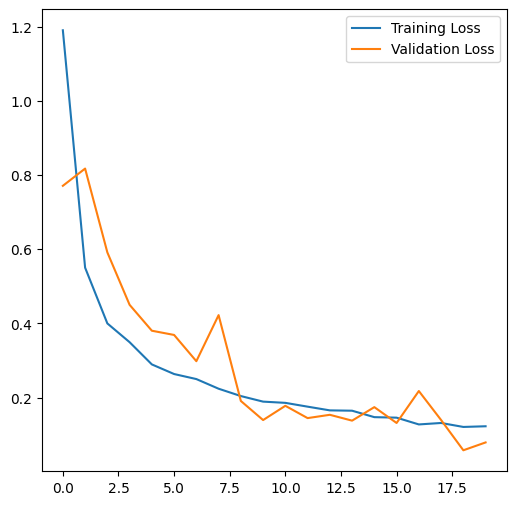

In [21]:
plt.figure(figsize=(6, 6))
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label ="Validation Loss")
plt.legend(loc="best")
plt.show()

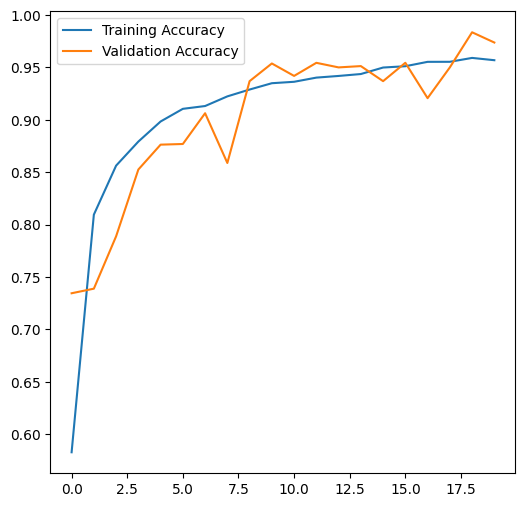

In [22]:
plt.figure(figsize=(6, 6))
plt.plot(history.history["accuracy"], label="Training Accuracy")
plt.plot(history.history["val_accuracy"], label ="Validation Accuracy")
plt.legend(loc="best")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 730ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


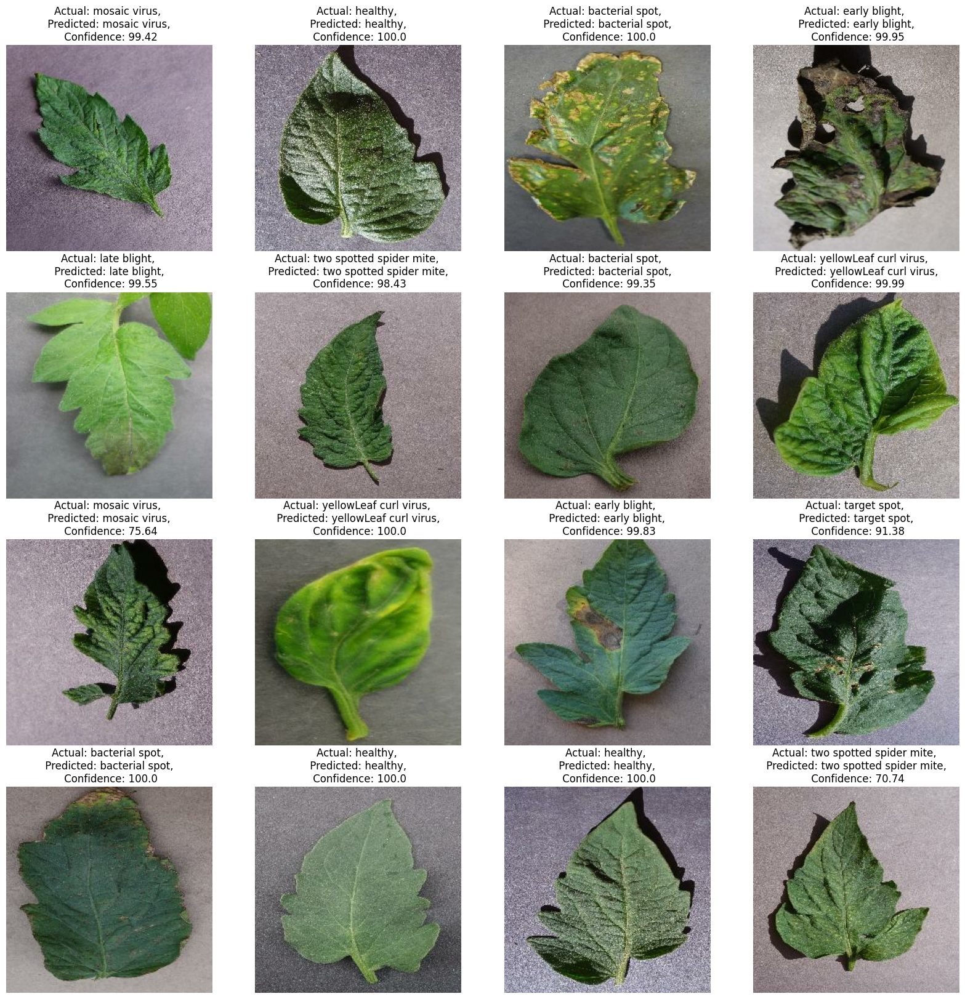

In [24]:
plt.figure(figsize=(20, 20))
for image, label in ds_test.take(1):
    for i in range(16):
        plt.subplot(4, 4, i + 1)
        plt.imshow(image[i].numpy().astype(int))
        img_arr = np.expand_dims(image[i], axis=0)
        probabilities = model.predict(img_arr)
        prediction = class_names[np.argmax(probabilities[0])]
        confidence = round((100 * np.max(probabilities[0])), 2)
        actual = class_names[label[i]]
        plt.title(f"Actual: {actual}, \n Predicted: {prediction}, \n Confidence: {confidence}")
        plt.axis("off")